# Analysis of Capital Budget Per Neighborhood

In [324]:
import pandas as pd
import numpy as np


df = pd.read_csv("/Users/sofi/Documents/4thyear/CS506/ds-boston-city-budget/fa23-team-f/data/CapitalBudgetCleaned.csv")
df.head()

,Unnamed: 0,Department,Project_Name,Scope_Of_Work,PM_Department,Project_Status,Neighborhood,Authorization_Existing,Authorization_FY,Authorization_Future,...,GO_Expended,Capital_Year_0,CapitalYear_1,Capital_Year_25,Grant_Expended,Grant_Year_0,Grant_Year_1,GrantYear_25,External_Funds,Total_Project_Budget
0,0,0,BCYF Security and Technology Upgrades,improvements to technology infrastructure and ...,Boston Centers for Youth and Families,To Be Scheduled,Citywide,750000,1250000,0,...,0,0,100000,1900000,0,0,0,0,0,2000000.0
1,1,0,BCYF Tobin Community Center Retaining Wall,repair or replace the retaining wall adjacent ...,Public Facilities Department,In Design,Mission Hill,1800000,0,0,...,0,100000,1500000,200000,0,0,0,0,0,1800000.0
2,2,0,BCYF North End Community Center,develop a design for a new north end community...,Public Facilities Department,In Design,North End,5000000,63000000,0,...,0,400000,3000000,64600000,0,0,0,0,20000000,88000000.0
3,3,0,Pool Repairs,renovate and upgrade locker rooms and pools in...,Boston Centers for Youth and Families,Annual Program,Citywide,1300000,1000000,0,...,383450,450000,700000,766550,0,0,0,0,0,2300000.0
4,4,0,Youth Budget Round 4,engage youth across the city to create a capit...,Youth Engagement and Employment,Implementation Underway,Citywide,1000000,0,0,...,17140,25000,250000,707860,0,0,0,0,0,1000000.0


In [303]:
colors = [
        '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
        '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf',
        '#1a55FF', '#55a8ff', '#6df7fd', '#f2ad92', '#d96459',
        '#f2a541', '#f2d83d', '#b2d732', '#33d9b2', '#127475',
        '#004777'
    ]

In [326]:

grouped_budgets = df.groupby('Neighborhood', as_index = False)['Total_Project_Budget'].sum()
grouped_budget = grouped_budgets.sort_values(by=['Total_Project_Budget'], inplace=True)
df = df.drop(df[df['Neighborhood'] == 'Citywide'].index)
df = df.drop(df[df['Neighborhood'] == 'Multiple Neighborhoods'].index)
grouped_budgets

,Neighborhood,Total_Project_Budget
2,Bay Village,1525000.0
20,West End,5000000.0
14,Mission Hill,5242212.0
11,Hyde Park,6615000.0
9,Fenway-Kenmore,12750000.0
3,Beacon Hill,34410000.0
21,West Roxbury,48645000.0
0,Allston/Brighton,57605000.0
8,East Boston,62457890.0
1,Back Bay,65442299.0


In [327]:
grouped_budgets["Neighborhood"]

2                    Bay Village
20                      West End
14                  Mission Hill
11                     Hyde Park
9                 Fenway-Kenmore
3                    Beacon Hill
21                  West Roxbury
0               Allston/Brighton
8                    East Boston
1                       Back Bay
12                 Jamaica Plain
19                     South End
13                      Mattapan
15                     North End
16                    Roslindale
10                Harbor Islands
18                  South Boston
17                       Roxbury
6                     Dorchester
5                      Chinatown
7     Downtown/Government Center
4                    Charlestown
Name: Neighborhood, dtype: object

In [328]:
neighborhoods = grouped_budgets["Neighborhood"]
cleaned_neighborhoods = [n.split('/')[0].split('-')[0] for n in neighborhoods]
a_index = cleaned_neighborhoods.index('Allston')+1
cleaned_neighborhoods.insert(a_index,'Brighton')
sb_index = cleaned_neighborhoods.index('South Boston')+1
cleaned_neighborhoods.insert(sb_index,'South Boston Waterfront')
sb_index = cleaned_neighborhoods.index('Chinatown')+1
cleaned_neighborhoods.insert(sb_index,'Leather District')
cleaned_neighborhoods

['Bay Village',
 'West End',
 'Mission Hill',
 'Hyde Park',
 'Fenway',
 'Beacon Hill',
 'West Roxbury',
 'Allston',
 'Brighton',
 'East Boston',
 'Back Bay',
 'Jamaica Plain',
 'South End',
 'Mattapan',
 'North End',
 'Roslindale',
 'Harbor Islands',
 'South Boston',
 'South Boston Waterfront',
 'Roxbury',
 'Dorchester',
 'Chinatown',
 'Leather District',
 'Downtown',
 'Charlestown']

In [329]:
import json
with open('/Users/sofi/Documents/4thyear/CS506/ds-boston-city-budget/fa23-team-f/data/Boston_Neighborhoods.geojson','r') as jsonFile:
    data = json.load(jsonFile)
temp = data
# remove zip codes that are not in this df
geozips = []
ab = []
for i in range(len(temp['features'])):
    if temp['features'][i]['properties']['Name'] in cleaned_neighborhoods:
        if temp['features'][i]['properties']['Name'] == 'Allston' or temp['features'][i]['properties']['Name'] == 'Brighton':
            # temp['features'][i]['properties']['Combine'] = 'yes'
            ab.append(temp['features'][i])
        else: 
            # temp['features'][i]['properties']['Combine'] = 'no'
            geozips.append(temp['features'][i])
geozips += ab

# geozips

In [330]:
from turfpy.transformation import dissolve, flatten_each
from geojson import Feature, Polygon, FeatureCollection
def update_merged_neighborhoods(geozips, i):
    geozips[i]['properties']['OBJECTID'] = str(geozips[i]['properties']['OBJECTID']) + '/' + str(geozips[i+1]['properties']['OBJECTID'])
    geozips[i]['properties']['Acres'] = geozips[i]['properties']['Acres'] + geozips[i+1]['properties']['Acres']
    geozips[i]['properties']['Neighborhood_ID'] = geozips[i]['properties']['Neighborhood_ID'] + '/' + geozips[i+1]['properties']['Neighborhood_ID']
    geozips[i]['properties']['SqMiles'] = round(geozips[i]['properties']['SqMiles'] + geozips[i+1]['properties']['SqMiles'], 2)
    geozips[i]['properties']['ShapeSTArea'] = geozips[i]['properties']['ShapeSTArea'] + geozips[i+1]['properties']['ShapeSTArea']
    geozips[i]['properties']['ShapeSTLength'] = geozips[i]['properties']['ShapeSTLength'] + geozips[i+1]['properties']['ShapeSTLength']
    
    # return geozips
    f1 = Feature(
            geometry=Polygon(geozips[i]['geometry']['coordinates']),
            properties={"combine": "yes"},
        )
    f2 = Feature(
        geometry=Polygon(geozips[i+1]['geometry']['coordinates']),
        properties={"combine": "yes"},
    )
    # print(f1)
    # print(f2)
    data = dissolve(FeatureCollection([f1, f2]), property_name="combine")
    # print(data['features'][0]['geometry']['coordinates'])
    geozips[i]['geometry']['coordinates'] = data['features'][0]['geometry']['coordinates']
    # geozips = geozips[:-1]
    geozips.remove(geozips[i+1])
    return geozips

sqMiles = {}
for i in range(len(geozips)-3):
    if geozips[i]['properties']['Name'] == 'Brighton':
        geozips[i]['properties']['Name'] = 'Allston/Brighton'
        geozips = update_merged_neighborhoods(geozips, i) 
    if geozips[i]['properties']['Name'] == 'South Boston Waterfront':
        geozips[i]['properties']['Name'] = 'South Boston'
        geozips = update_merged_neighborhoods(geozips, i)
    if geozips[i]['properties']['Name'] == 'Leather District':
        geozips[i]['properties']['Name'] = 'Chinatown'
        geozips = update_merged_neighborhoods(geozips, i)
    if geozips[i]['properties']['Name'] == 'Downtown':
        geozips[i]['properties']['Name'] = 'Downtown/Government Center'
    if geozips[i]['properties']['Name'] == 'Fenway':
        geozips[i]['properties']['Name'] = 'Fenway-Kenmore'
    sqMiles[geozips[i]['properties']['Name']] = geozips[i]['properties']['SqMiles']

# geozips[-1]

        

/Users/sofi/miniconda3/lib/python3.9/site-packages/turfpy/transformation.py:283: ShapelyDeprecationWarning: The 'cascaded_union()' function is deprecated. Use 'unary_union()' instead.
  result = cascaded_union(shapes)


In [331]:
new_json = dict.fromkeys(['type','features'])
new_json['type'] = 'FeatureCollection'
new_json['features'] = geozips

# save JSON object as updated-file
open("boston_neighborhoods.json", "w").write(
    json.dumps(new_json, sort_keys=True, indent=4, separators=(',', ': '))
)

4731139

In [332]:
import folium
import selenium #install if you haven't already
from IPython.display import Image #install if you haven't already

def convert_map_to_png(map, filename):
    """
    Method to convert a folium map to a png file by
    saving the map as an html file and then taking a
    screenshot of the html file on the browser.

    map : folium map object
        The map to be converted to a png file
    filename : str, does not include file type
    """
    import os
    import time
    from selenium import webdriver

    html_filename=f'{filename}.html'
    map.save(html_filename)

    tmpurl=f'file://{os.getcwd()}/{html_filename}'
    
    try:
        try:
            browser = webdriver.Firefox()
        except:
            browser = webdriver.Chrome()
    except:
        browser = webdriver.Safari()

    browser.get(tmpurl)
    # browser.execute_script("document.body.style.zoom = '150%'")  
    time.sleep(5)
    browser.save_screenshot(f'{filename}.png')
    browser.quit()
    # os.remove(html_filename)

    return Image(f'{filename}.png')

def create_map(table, add_text = ''):
    # read updated GeoJSON 
    bos_geo = r'boston_neighborhoods.json'
    m = folium.Map(location = [42.320,-71.05], zoom_start = 11,min_zoom=11)
    # creating a choropleth map
    cp = folium.Choropleth(
        geo_data = bos_geo,
        fill_opacity = 0.7,
        line_opacity = 0.2,
        data = table,
        name = 'choropleth',
        # refers to which key within the GeoJSON to map the ZIP code to
        key_on = 'feature.properties.Name',
        # first element contains location information, second element contains feature of interest
        columns = ['Neighborhood','Total_Project_Budget'],
        fill_color = 'RdYlGn',
        legend_name = (' ').join('Total_Project_Budget'.split('_')).title() + ' ' + add_text + ' Across Boston Neighborhoods'
    ).add_to(m)
    folium.GeoJsonTooltip(['Name']).add_to(cp.geojson)
    folium.LayerControl().add_to(m)
    folium.map.CustomPane('labels').add_to(m)
    folium.TileLayer('CartoDBPositronOnlyLabels',
                 pane='labels').add_to(m)
    # save map with filename based on the feature of interest
    # m.save(outfile = 'Total_Project_Budget' + '_map.html')
    convert_map_to_png(m, 'Total_Project_Budget_map')


In [333]:
grouped_budgets

,Neighborhood,Total_Project_Budget
2,Bay Village,1525000.0
20,West End,5000000.0
14,Mission Hill,5242212.0
11,Hyde Park,6615000.0
9,Fenway-Kenmore,12750000.0
3,Beacon Hill,34410000.0
21,West Roxbury,48645000.0
0,Allston/Brighton,57605000.0
8,East Boston,62457890.0
1,Back Bay,65442299.0


## Map of Total Capital Budget Per Neighborhood
For the names of each neighborhood go to the html file Total_Project_Budget_map.html in this folder and click each neighborhood polygon.

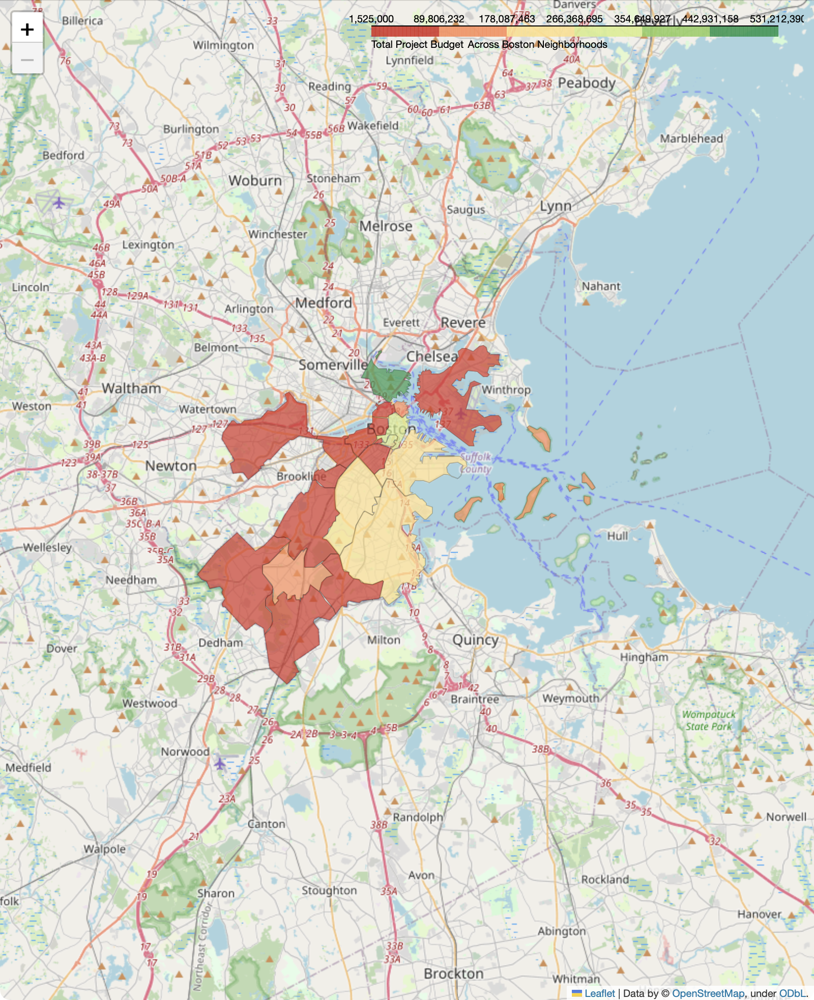

In [334]:
create_map(grouped_budgets, add_text = '')

Image('Total_Project_Budget_map.png')


### Map with More Visible Neighborhood Labels

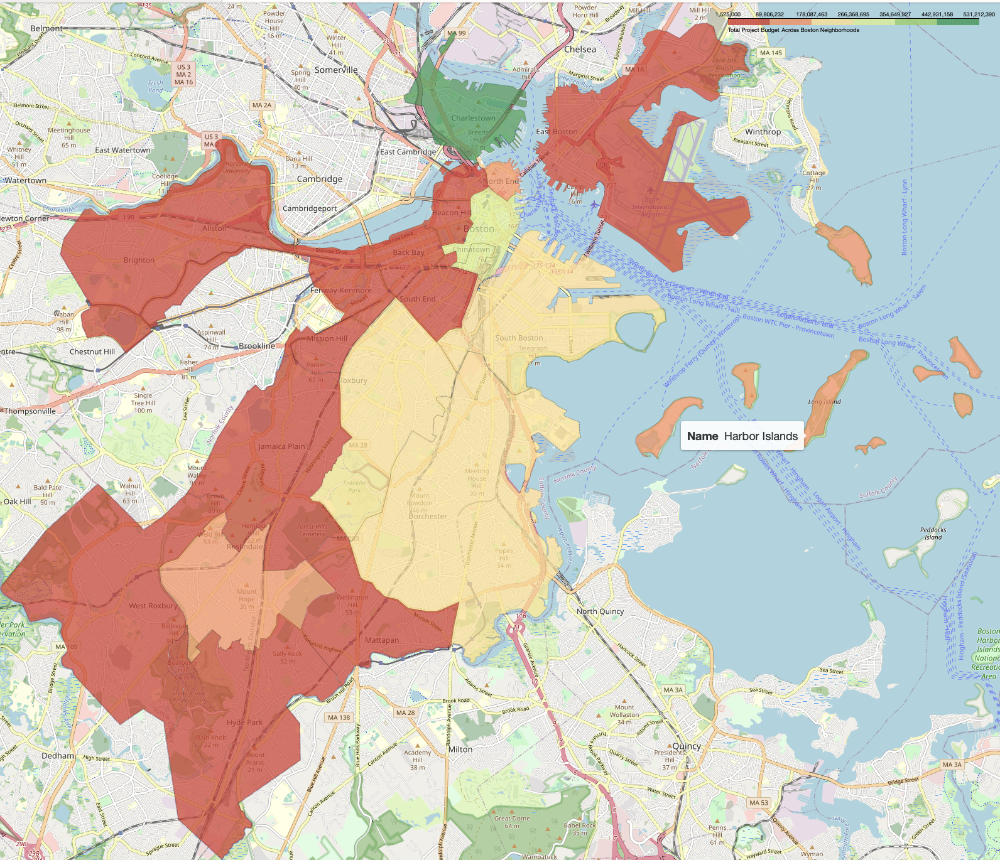

In [337]:
Image('/Users/sofi/Documents/4thyear/CS506/ds-boston-city-budget/fa23-team-f/VisibleLabelsCBudgetMap.png')

## Total Budget Per Square Mile

In [335]:
sqMiles

{'Roslindale': 2.51,
 'Jamaica Plain': 3.94,
 'Mission Hill': 0.55,
 'Bay Village': 0.04,
 'Chinatown': 0.14,
 'North End': 0.2,
 'Roxbury': 3.29,
 'South End': 0.74,
 'Back Bay': 0.62,
 'East Boston': 4.71,
 'Charlestown': 1.36,
 'West End': 0.3,
 'Beacon Hill': 0.31,
 'Downtown/Government Center': 0.62,
 'Fenway-Kenmore': 0.88,
 'West Roxbury': 5.49,
 'Hyde Park': 4.57,
 'Mattapan': 2.11,
 'Dorchester': 7.29,
 'South Boston': 3.22,
 'Harbor Islands': 1.29,
 'Allston/Brighton': 4.44}

In [338]:
grouped_budgets['sqMiles'] = grouped_budgets['Neighborhood'].apply(lambda x: sqMiles.get(x))
grouped_budgets

,Neighborhood,Total_Project_Budget,sqMiles
2,Bay Village,1525000.0,0.04
20,West End,5000000.0,0.30
14,Mission Hill,5242212.0,0.55
11,Hyde Park,6615000.0,4.57
9,Fenway-Kenmore,12750000.0,0.88
3,Beacon Hill,34410000.0,0.31
21,West Roxbury,48645000.0,5.49
0,Allston/Brighton,57605000.0,4.44
8,East Boston,62457890.0,4.71
1,Back Bay,65442299.0,0.62


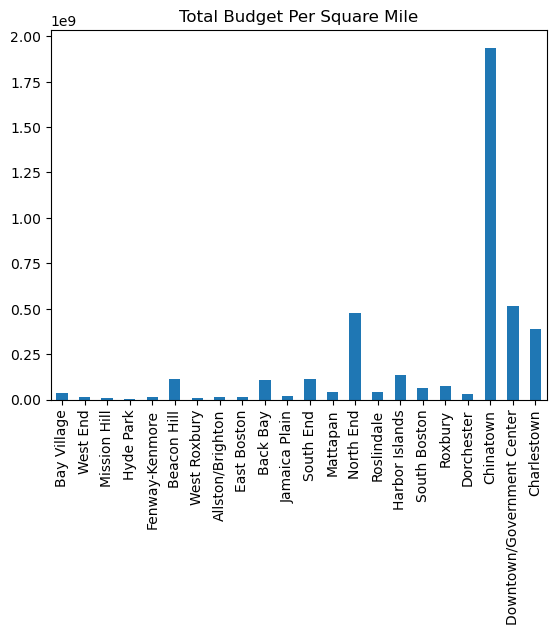

In [339]:
import matplotlib.pyplot as plt
grouped_budgets['Budget_per_sqm'] = grouped_budgets['Total_Project_Budget'] / grouped_budgets['sqMiles']

grouped_budgets['Budget_per_sqm'].plot(kind='bar')
ax = plt.gca()
ax.set_title('Total Budget Per Square Mile')
ax.set_xticklabels(grouped_budgets['Neighborhood'])

plt.show()

## Total Budget Per Neighborhood Population

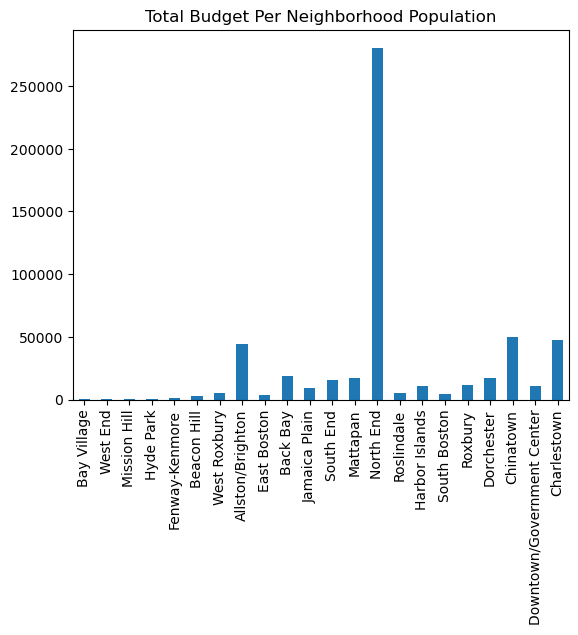

In [340]:
population_by_neighborhood = pd.DataFrame([
    {'Neighborhood': 'Bay Village', 'Population': 1312},
    {'Neighborhood': 'West End', 'Population': 3558},
    {'Neighborhood': 'Mission Hill', 'Population': 6687},
    {'Neighborhood': 'Hyde Park', 'Population': 13147},
    {'Neighborhood': 'Fenway-Kenmore', 'Population': 11226},
    {'Neighborhood': 'Beacon Hill', 'Population': 5427},
    {'Neighborhood': 'West Roxbury', 'Population': 13933},
    {'Neighborhood': 'Allston/Brighton', 'Population': 29224},
    {'Neighborhood': 'East Boston', 'Population': 16565},
    {'Neighborhood': 'Back Bay', 'Population': 9829},
    {'Neighborhood': 'Jamaica Plain', 'Population': 16423},
    {'Neighborhood': 'South End', 'Population': 16819},
    {'Neighborhood': 'Mattapan', 'Population': 9173},
    {'Neighborhood': 'North End', 'Population': 5086},
    {'Neighborhood': 'Roslindale', 'Population': 11482},
    {'Neighborhood': 'Harbor Islands', 'Population': 340},
    {'Neighborhood': 'South Boston', 'Population': 19358},
    {'Neighborhood': 'Roxbury', 'Population': 19899},
    {'Neighborhood': 'Dorchester', 'Population': 44301},
    {'Neighborhood': 'Chinatown', 'Population': 5460},
    {'Neighborhood': 'Downtown/Government Center', 'Population': 7942},
    {'Neighborhood': 'Charlestown', 'Population': 9162},
    {'Neighborhood': 'Total', 'Population': 269522},
])

grouped_budgets['Budget_per_pop'] = grouped_budgets['Total_Project_Budget'] / population_by_neighborhood['Population']

grouped_budgets['Budget_per_pop'].plot(kind='bar')
ax = plt.gca()
ax.set_title('Total Budget Per Neighborhood Population')
ax.set_xticklabels(grouped_budgets['Neighborhood'])

plt.show()

## Budget Pie Charts For Each Year of Capital Plan

In [341]:
grouped_budgets

,Neighborhood,Total_Project_Budget,sqMiles,Budget_per_sqm,Budget_per_pop
2,Bay Village,1525000.0,0.04,3.812500e+07,228.054434
20,West End,5000000.0,0.30,1.666667e+07,629.564341
14,Mission Hill,5242212.0,0.55,9.531295e+06,456.559136
11,Hyde Park,6615000.0,4.57,1.447484e+06,393.305191
9,Fenway-Kenmore,12750000.0,0.88,1.448864e+07,1297.181809
3,Beacon Hill,34410000.0,0.31,1.110000e+08,2617.327147
21,West Roxbury,48645000.0,5.49,8.860656e+06,5309.430255
0,Allston/Brighton,57605000.0,4.44,1.297410e+07,43906.250000
8,East Boston,62457890.0,4.71,1.326070e+07,3770.473287
1,Back Bay,65442299.0,0.62,1.055521e+08,18393.001405


In [342]:
import matplotlib.pyplot as plt
import seaborn as sns

def autopct_format(values):
    def my_format(pct):
        return ('%.1f%%' % pct) if pct > 5 else ''
    return my_format
def plot_pie_chart(df,name):
    dfb = df.sort_values(f'Total_{name}_Budget', ascending=False)
    dfb = dfb.loc[dfb[f'Total_{name}_Budget'] > 0]
    # dfb['Percentage'] = 100.*dfb[f'Total_{name}_Budget']/dfb[f'Total_{name}_Budget'].sum()
    # Create a list of labels, only include the label if the percentage is greater than 5
    # labels = [n if p > 5 else '' for n, p in zip(dfb['Neighborhood'], percentages)]
    
    # Create the pie chart
    # wedges, texts, autotexts = plt.pie(grouped_budgets['Total_Project_Budget'], labels=labels,autopct=autopct_format(grouped_budgets['Total_Project_Budget']))
    wedges, texts, autotexts = plt.pie(dfb[f'Total_{name}_Budget'], labels=None,autopct=autopct_format(dfb[f'Total_{name}_Budget']), colors=colors)
    # Set the title
    plt.suptitle(f'Total {" ".join(name.split("_"))} Budget', fontsize=16, y=0.95)
    plt.title('Per Neighborhood', fontsize=14, y=0.95)

    # Create a legend
    plt.legend(wedges, dfb['Neighborhood'], title="Neighborhoods", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

    # Show the plot
    plt.show()




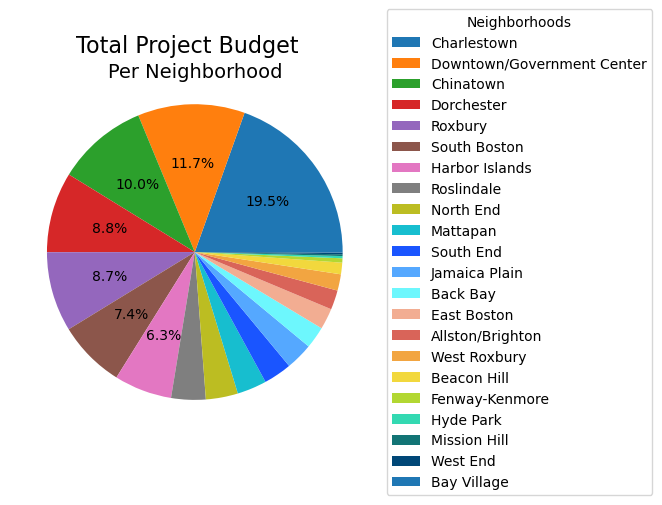

In [343]:
plot_pie_chart(grouped_budgets,'Project')

In [344]:
def group_budgets(df,colnames,name):
    r = df.groupby('Neighborhood', as_index = False)[colnames].sum()
    r[f'Total_{name}_Budget'] = r[colnames].sum(axis=1)
    r.sort_values(by=[f'Total_{name}_Budget'],inplace=True)
    r['Percentage'] = 100.*r[f'Total_{name}_Budget']/r[f'Total_{name}_Budget'].sum()
    return r

In [345]:
exp_budgets = group_budgets(df,['GO_Expended','Grant_Expended'],'Expended')
exp_budgets

,Neighborhood,GO_Expended,Grant_Expended,Total_Expended_Budget,Percentage
13,Mattapan,-18400,0,-18400,-0.010303
14,Mission Hill,0,0,0,0.000000
9,Fenway-Kenmore,0,0,0,0.000000
20,West End,0,0,0,0.000000
2,Bay Village,5758,0,5758,0.003224
16,Roslindale,0,33835,33835,0.018945
11,Hyde Park,87341,0,87341,0.048904
15,North End,122646,0,122646,0.068672
3,Beacon Hill,0,823432,823432,0.461056
21,West Roxbury,1093608,0,1093608,0.612333


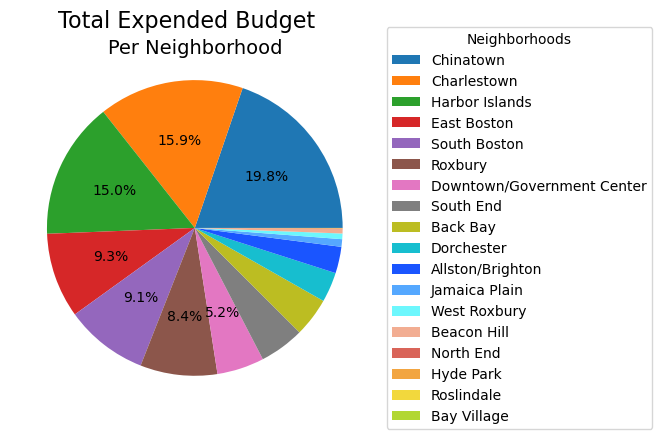

In [346]:
plot_pie_chart(exp_budgets,'Expended')

In [347]:
y0_budgets = group_budgets(df,['Capital_Year_0','Grant_Year_0'],'Year_0')
y0_budgets

,Neighborhood,Capital_Year_0,Grant_Year_0,Total_Year_0_Budget,Percentage
20,West End,0,0,0,0.000000
2,Bay Village,25000,0,25000,0.016664
3,Beacon Hill,100000,90000,190000,0.126648
14,Mission Hill,225000,0,225000,0.149978
9,Fenway-Kenmore,300000,0,300000,0.199971
11,Hyde Park,575000,0,575000,0.383277
13,Mattapan,575000,0,575000,0.383277
16,Roslindale,575000,5325,580325,0.386827
15,North End,650000,0,650000,0.433270
10,Harbor Islands,850000,50000,900000,0.599912


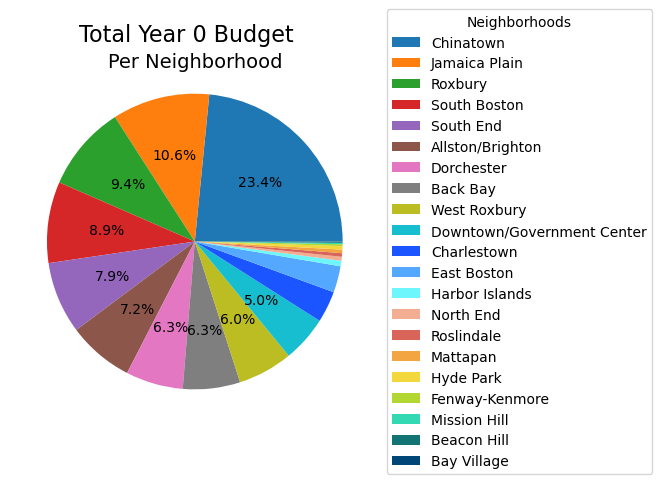

In [348]:
plot_pie_chart(y0_budgets,'Year_0')

In [349]:
print(df.columns)
df.columns = [col.replace(' ', '') for col in df.columns]

Index(['Unnamed: 0', 'Department', 'Project_Name', 'Scope_Of_Work',
       'PM_Department', 'Project_Status', 'Neighborhood',
       'Authorization_Existing', 'Authorization_FY', 'Authorization_Future',
       ' Grant_Existing ', ' Grant_FY ', ' Grant_Future ', 'GO_Expended',
       'Capital_Year_0', ' CapitalYear_1 ', 'Capital_Year_25',
       'Grant_Expended', 'Grant_Year_0', ' Grant_Year_1 ', 'GrantYear_25',
       'External_Funds', 'Total_Project_Budget'],
      dtype='object')


In [350]:
y1_budgets = group_budgets(df,['CapitalYear_1','Grant_Year_1'],'Year_1')
y1_budgets

,Neighborhood,CapitalYear_1,Grant_Year_1,Total_Year_1_Budget,Percentage
20,West End,0,0,0,0.000000
2,Bay Village,225000,0,225000,0.038210
3,Beacon Hill,700000,175000,875000,0.148596
9,Fenway-Kenmore,1250000,0,1250000,0.212280
11,Hyde Park,2138500,0,2138500,0.363168
14,Mission Hill,2225000,0,2225000,0.377858
15,North End,4681537,0,4681537,0.795037
13,Mattapan,1518400,4000000,5518400,0.937156
0,Allston/Brighton,6222448,0,6222448,1.056720
21,West Roxbury,12943936,0,12943936,2.198190


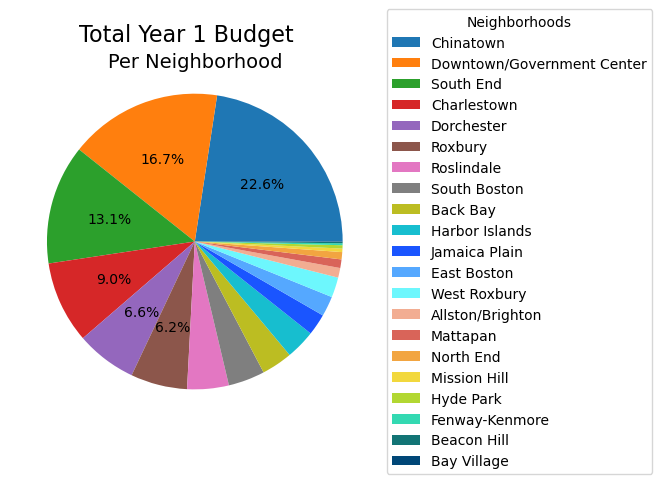

In [351]:
plot_pie_chart(y1_budgets,'Year_1')

In [352]:
y25_budgets = group_budgets(df,['Capital_Year_25','GrantYear_25'],'Years_2-5')
y25_budgets

,Neighborhood,Capital_Year_25,GrantYear_25,Total_Years_2-5_Budget,Percentage
2,Bay Village,1099242,0,1099242,0.072147
14,Mission Hill,2792212,0,2792212,0.183262
11,Hyde Park,3814159,0,3814159,0.250336
20,West End,3000000,2000000,5000000,0.328167
9,Fenway-Kenmore,11200000,0,11200000,0.735094
1,Back Bay,19602057,431148,20033205,1.314847
21,West Roxbury,25607456,0,25607456,1.680703
8,East Boston,25893977,2000000,27893977,1.830775
3,Beacon Hill,10610000,21911568,32521568,2.134500
0,Allston/Brighton,33362023,1000000,34362023,2.255295


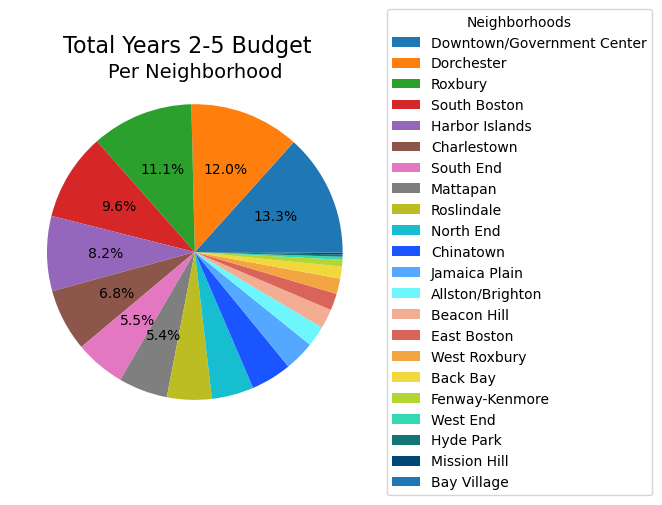

In [353]:
plot_pie_chart(y25_budgets,'Years_2-5')

## Percentage Differences Over the Years of Capital Plan

In [354]:
# Calculate the percentage differences
df_diff = pd.DataFrame({
    'Expended': exp_budgets.set_index('Neighborhood')['Percentage'],
    'Year_0': y0_budgets.set_index('Neighborhood')['Percentage'],
    'Year_1': y1_budgets.set_index('Neighborhood')['Percentage'],
    'Year_25': y25_budgets.set_index('Neighborhood')['Percentage'],
})
# Calculate the maximum difference in each row
df_diff['Max_Change'] = df_diff.max(axis=1) - df_diff.min(axis=1)

# Sort by the maximum difference
df_diff = df_diff.sort_values(by='Max_Change', ascending=False)
df_diff


,Expended,Year_0,Year_1,Year_25,Max_Change
Neighborhood,,,,,
Chinatown,19.754939,23.433230,22.586580,4.452268,18.980963
Harbor Islands,15.005531,0.599912,3.243637,8.202773,14.405619
Charlestown,15.877008,3.436545,8.958211,6.818219,12.440463
Downtown/Government Center,5.161159,5.038920,16.718898,13.336003,11.679978
Jamaica Plain,0.830338,10.643532,2.345903,3.310262,9.813195
Dorchester,3.275422,6.268807,6.638883,12.036771,8.761349
South End,4.906118,7.872710,13.074743,5.504608,8.168625
East Boston,9.308960,2.887834,2.200918,1.830775,7.478184
Allston/Brighton,2.897568,7.215980,1.056720,2.255295,6.159260


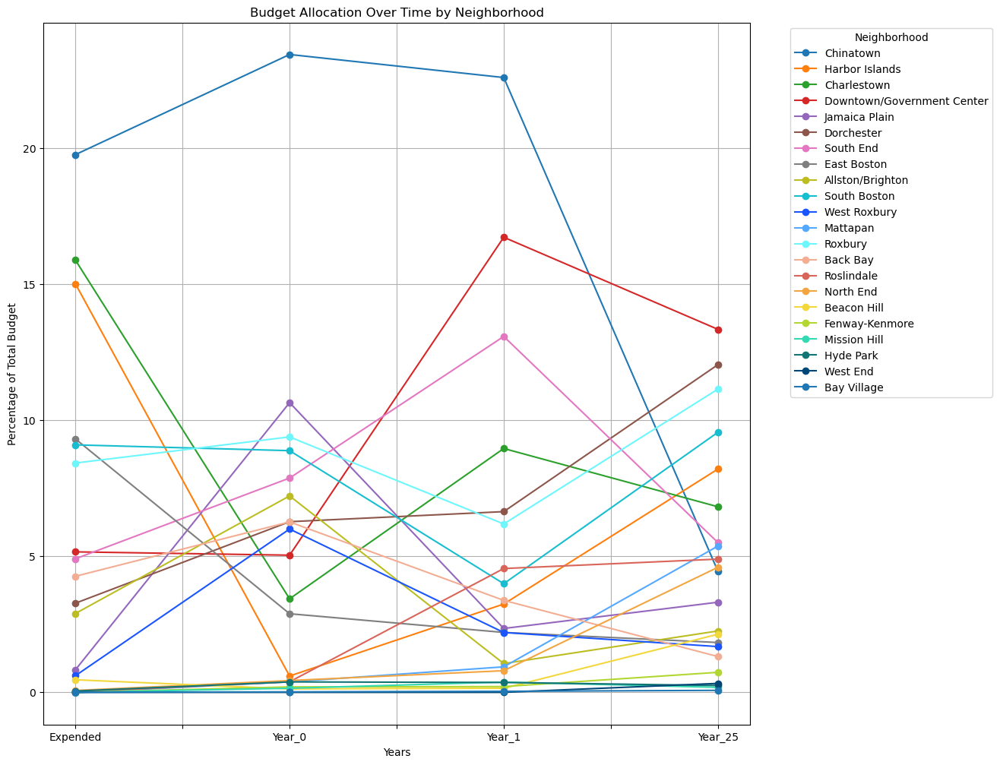

In [355]:
# line chart
df_diff.iloc[:, :-1].T.plot(kind='line', marker='o', figsize=(12, 12),color=colors)

plt.xlabel('Years')
plt.ylabel('Percentage of Total Budget')
plt.title('Budget Allocation Over Time by Neighborhood')
plt.grid(True)

plt.legend(title='Neighborhood',bbox_to_anchor=(1.05, 1))
plt.show()

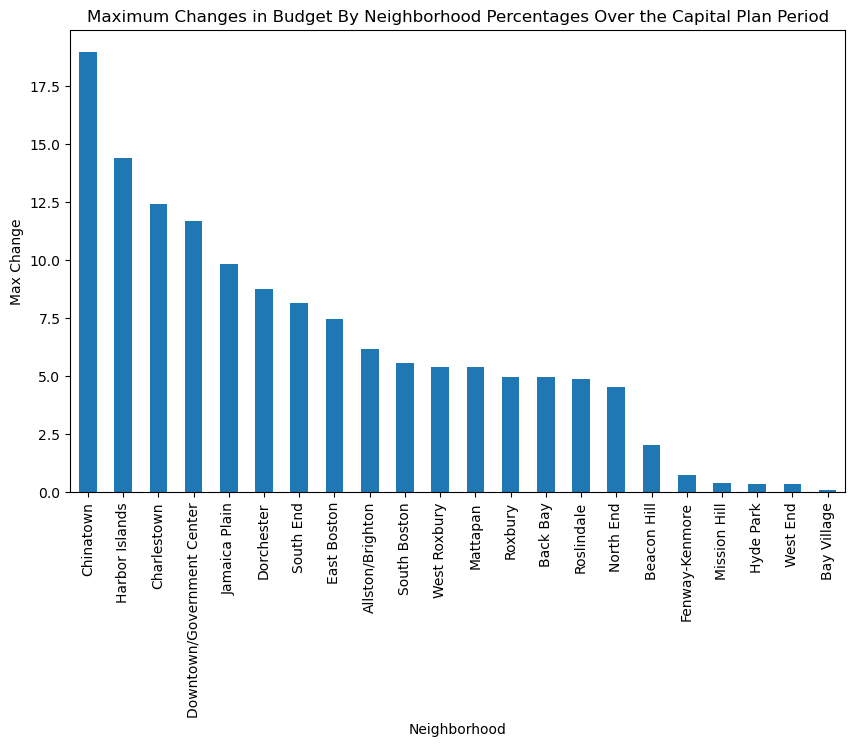

In [356]:
df_diff['Max_Change'].plot(kind='bar', figsize=(10, 6))
plt.title('Maximum Changes in Budget By Neighborhood Percentages Over the Capital Plan Period')
plt.ylabel('Max Change')
plt.show()